#  2020AIML544 - UNSUPERVISED LEARNING - ASSIGNMENT2

## CREDIT CARD USAGE

## Overall Approach

### EDA & FEATURE ENGINEERING TASKS PERFORMED:
    1. READ THE EXCEL FILE INTO A DATAFRAME  
    2. CHECK THE STATISTICS OF DATA USING DESCRIBE FUNCTION
    3. CHECK FOR DUPLICATE ROWS & NULL VALUES  
    4. HEATMAP, BOXLOT & HISTOGRAM PLOTS
    5. OUTLIER DETECTION AND HANDLING
    6. DATA NORMALIZATION
    7. PRINCIPAL COMPONENT ANALYSIS

### MODEL BUILDING & PERFORMANCE ANALYSIS:
    1. AGGLOMERATIVE CLUSTERING AFTER OUTLIER REMOVAL
    2. DBSCAN CLUSTERING AFTER OUTLIER REMOVAL
    3. EVALUATION OF CLUSTER MODELS USING SILHOUTTE SCORE
    4. DETERMINE THE BEST CLUSTERING MODEL
    5. DENDROGRAM PLOT TO CROSS-CHECK OPTIMAL NUMBER OF CLUSTERS
    6. PARALLEL COORDINATES FOR CLUSTER VISUALIZATION
    7. BUSINESS INSIGHTS / CLUSTER INTERPRETATION 

#### Import all needed libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.cluster.hierarchy as shc

from pandas import DataFrame
from pandas.plotting import parallel_coordinates
from sklearn.preprocessing import normalize, StandardScaler
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn import model_selection
from sklearn.metrics import silhouette_score
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

### <span style='background : yellow' > **TASK 1:**</span> EXPLORATORY DATA ANALYSIS 

#### Read the input excel file into a dataframe

In [2]:
file_path = r"C:\Users\Aspire V3-572\CC GENERAL.CSV"
df = pd.read_csv(file_path, header=0)

#### Display information about the dataframe using head function

In [3]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


#### Check the number of records in the dataset using shape function

In [4]:
df.shape

(8950, 18)

There are 8950 records and 18 attributes in the dataset.

Let's take a quick look at the columns

In [5]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

#### Drop CUST_ID field as it doesn't have any significance in clustering

In [6]:
df = df.drop('CUST_ID', axis=1)

#### Check the statistics of attributes using describe function. 

In [7]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


**Observation:** This is the statistical summary of the data. Since our attributes are categorical, we cannot see the mean, median values, instead can find the unique values and top occurances

<b>
Check the quality of the data and data types of each column using info function
</b>

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

### <span style='background : yellow' > **TASK 2:**</span> PREPROCESSING/ FEATURE ENGINEERING

### <span style='color: Black'>Data Cleaning </span>

<b>
Checking for duplicate rows
</b>

**Observation:** There are no duplicate rows in our dataset

In [9]:
dv = df.duplicated(keep=False)
dv.sum()

0

### <span style='color: Black'>Missing Values Imputation </span>

**Observation:** There are Null values in the fields CREDIT_LIMIT & MINIMUM_PAYMENTS. 

In [10]:
df.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [11]:
# Filling the missing values with forward fill method
df.fillna(method ='ffill', inplace = True)

In [12]:
df.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

<span style='color:Black'>
<b>

HEATMAP TO CHECK CORRELATION 
</b>
</span>


<AxesSubplot:>

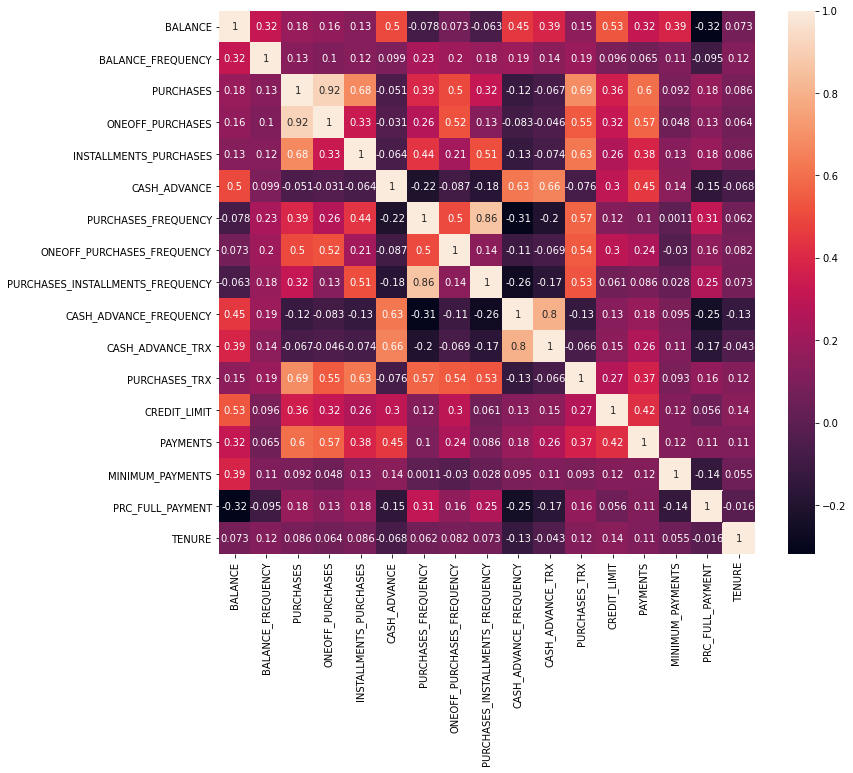

In [13]:
plt.figure(figsize=(12, 10))
correlation = df.corr()
sns.heatmap(correlation,xticklabels=correlation.columns, yticklabels=correlation.columns,annot=True)

#### HISTOGRAM PLOTS TO CHECK DISTRIBUTION

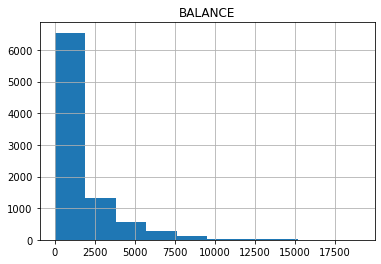

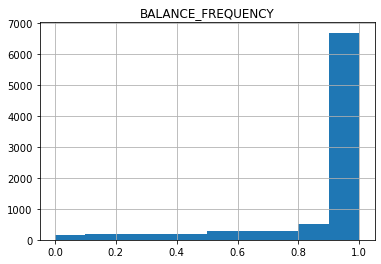

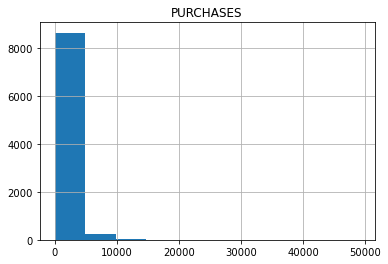

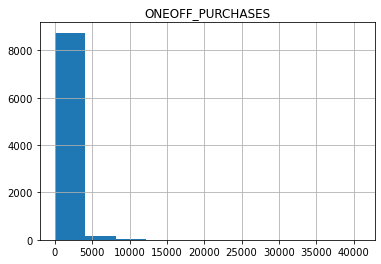

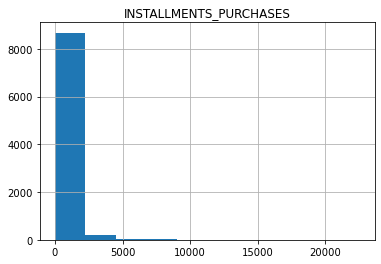

...

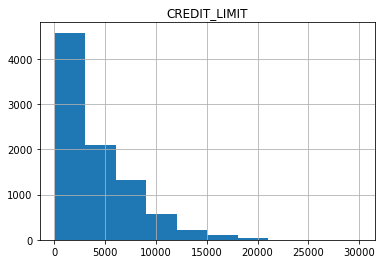

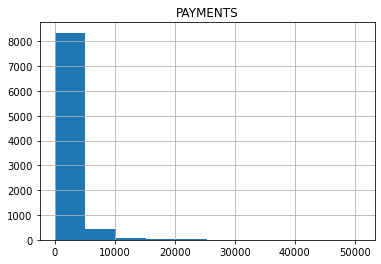

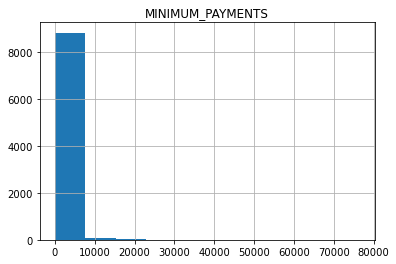

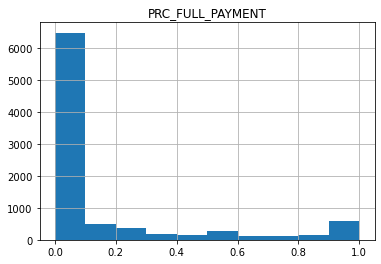

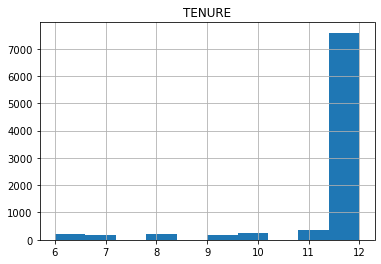

In [14]:
for col in df:
    df[[col]].hist()

#### BOX PLOTS TO CHECK OUTLIERS

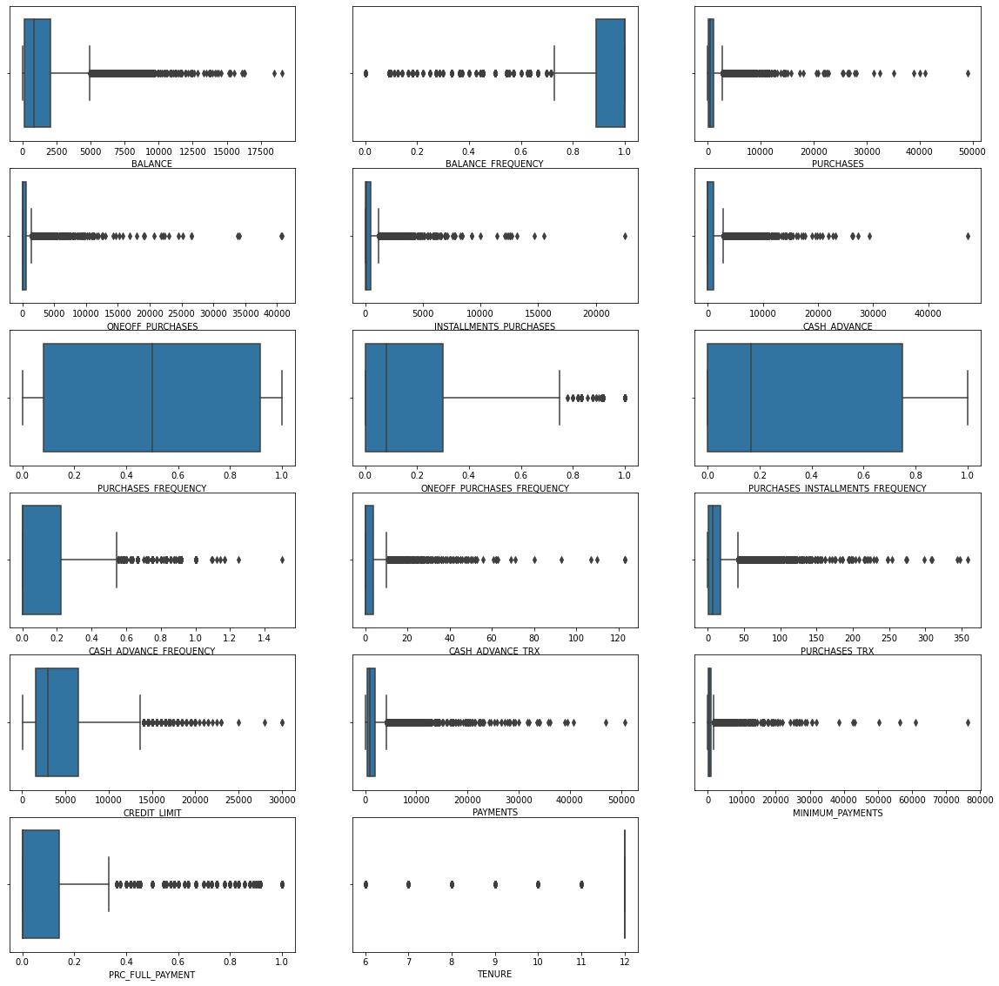

In [15]:
fig = plt.figure(figsize=(20,20))
for col in range(len(df.columns)) :
    fig.add_subplot(6,3,col+1)
    sns.boxplot(x=df.iloc[ : , col])
plt.show()

### OUTLIER HANDLING USING IQR METHOD

In [16]:
df1 = df.copy()
cols = df1.columns

for col in cols:
    Q1  = df1[col].quantile(0.25) 
    Q3  = df1[col].quantile(0.75) 
    IQR = Q3 - Q1
    lower_bound = Q1 - (1.5 * IQR)
    upper_bound = Q3 + (1.5 * IQR)
    mean = float(df1[col].mean())
    
    df1[col] = np.where(df1[col] < lower_bound, lower_bound, df1[col])
    df1[col] = np.where(df1[col] > upper_bound, upper_bound, df1[col])
    #replacing all outliers above upper bound by upper bound and below lower bound by lower bound values

In [17]:
df1_no_outlier = df1.copy()

#### BOXPLOTS AFTER REMOVING OUTLIERS

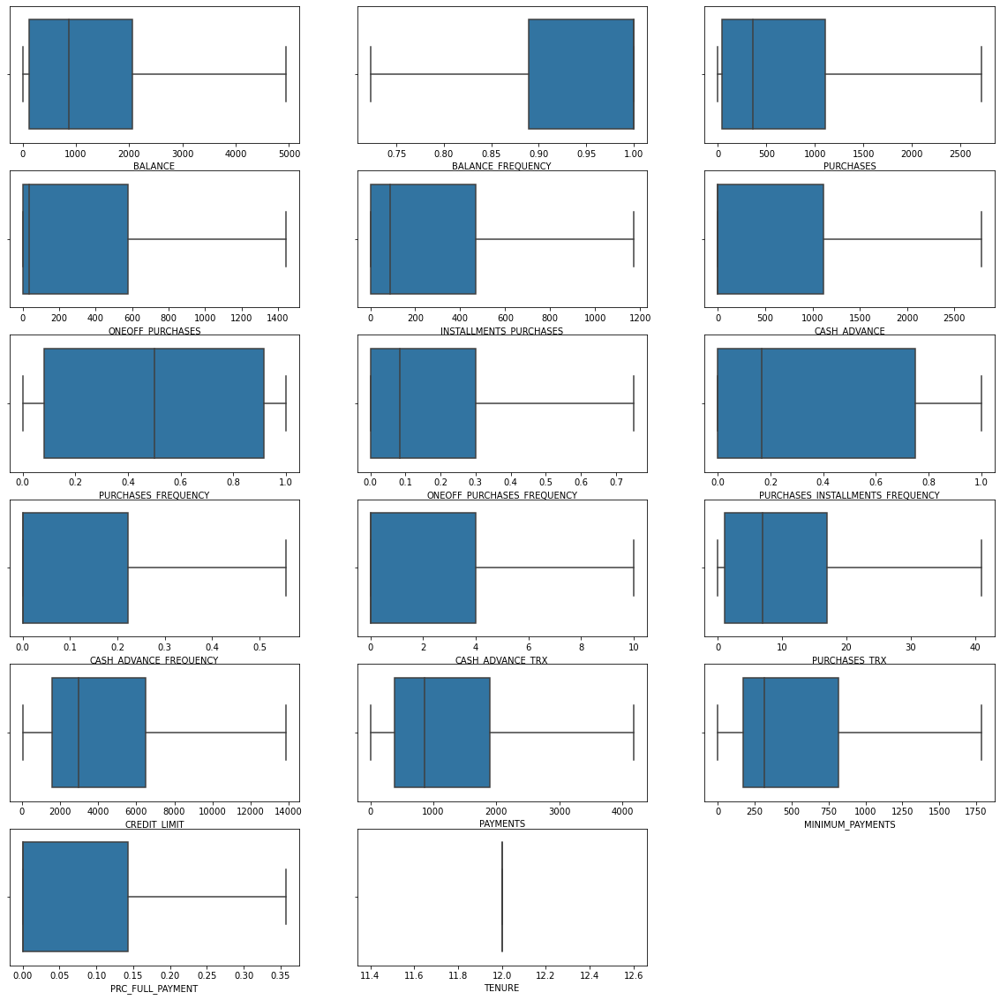

In [18]:
fig = plt.figure(figsize=(20,20))
for col in range(len(df1_no_outlier.columns)) :
    fig.add_subplot(6,3,col+1)
    sns.boxplot(x=df1_no_outlier.iloc[ : , col])
plt.show()

#### FUNCTION FOR CLUSTER PLOTTING

In [19]:
#create plot model clustering function
def plot_model_clustering(model, data):
  plt.figure(figsize=(15,9))
  model.fit(data)
  labels= model.labels_
  df_label=data.copy()
  df_label['labels']= labels
  ax = sns.scatterplot(x='PC1', y='PC2', hue='labels', data=df_label, palette='bright')
  for index in range(len(str(model))):
    if str(model)[index] == '(':
      ind = index
  ax.set_title(str(model)[:ind])


#### FUNCTION FOR PLOTTING PARALLEL COORDINATES

In [20]:
def display_parallel_coordinates(df, num_clusters):
    '''Display a parallel coordinates plot for the clusters in df'''

    # Select data points for individual clusters
    cluster_points = []
    for i in range(num_clusters):
        cluster_points.append(df[df.cluster==i])
    
    # Create the plot
    fig = plt.figure(figsize=(12, 15))
    title = fig.suptitle("Parallel Coordinates Plot for the Clusters", fontsize=18)
    fig.subplots_adjust(top=0.95, wspace=0)

    # Display one plot for each cluster, with the lines for the main cluster appearing over the lines for the other clusters
    for i in range(num_clusters):    
        plt.subplot(num_clusters, 1, i+1)
        for j,c in enumerate(cluster_points): 
            if i!= j:
                pc = parallel_coordinates(c, 'cluster', color=[addAlpha(palette[j],0.2)])
        pc = parallel_coordinates(cluster_points[i], 'cluster', color=[addAlpha(palette[i],0.5)])

        # Stagger the axes
        ax=plt.gca()
        for tick in ax.xaxis.get_major_ticks()[1::2]:
            tick.set_pad(20)        
            
def addAlpha(colour, alpha):
    '''Add an alpha to the RGB colour'''  
    return (colour[0],colour[1],colour[2],alpha)

#### DATA NORMALIZATION

In [21]:
#Normalizing the Data 
normalized_df = pd.DataFrame(normalize(df1_no_outlier), columns = df1_no_outlier.columns)
normalized_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.039353,0.000787,0.091790,0.000000,0.09179,0.000000,0.000160,0.000000,0.00008,0.000000,0.000000,0.001924,0.962156,0.194165,0.134230,0.000000,0.011546
1,0.347368,0.000099,0.000000,0.000000,0.00000,0.302037,0.000000,0.000000,0.00000,0.000027,0.000434,0.000000,0.759281,0.445051,0.116315,0.000024,0.001302
2,0.310798,0.000125,0.096307,0.096307,0.00000,0.000000,0.000125,0.000093,0.00000,0.000000,0.000000,0.001495,0.934206,0.077485,0.078135,0.000000,0.001495
3,0.208669,0.000090,0.187677,0.180729,0.00000,0.025765,0.000010,0.000010,0.00000,0.000010,0.000125,0.000125,0.939009,0.000000,0.078537,0.000000,0.001502
4,0.504284,0.000617,0.009867,0.009867,0.00000,0.000000,0.000051,0.000051,0.00000,0.000000,0.000000,0.000617,0.740040,0.418329,0.150963,0.000000,0.007400


<AxesSubplot:>

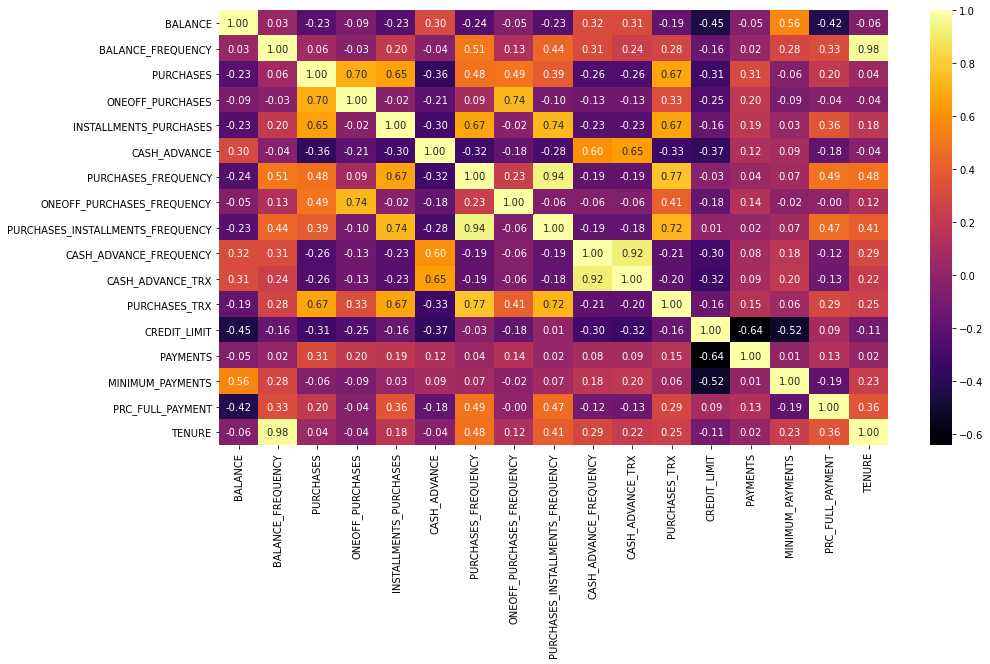

In [22]:
#Correlation matrix for normalized data

fig = plt.subplots(figsize=(15,8))

sns.heatmap(normalized_df.corr(),
            annot=True,
            fmt="0.2f",
            cmap="inferno")


#### HISTOGRAM PLOTS AFTER NORMALIZATION & OULIER REMOVAL

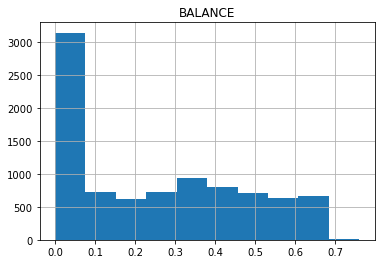

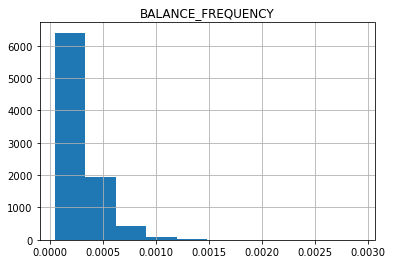

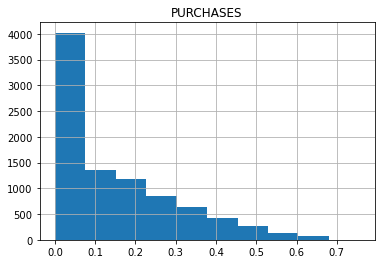

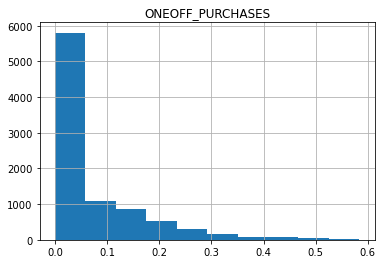

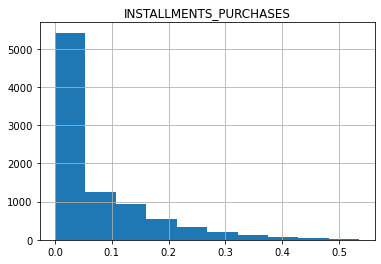

...

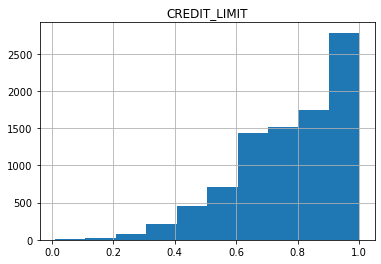

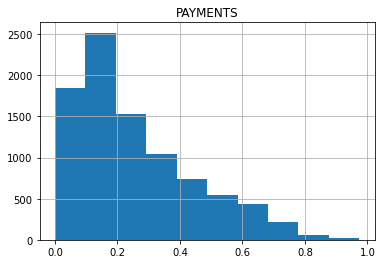

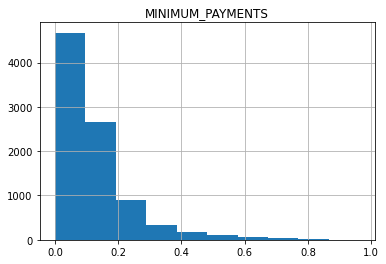

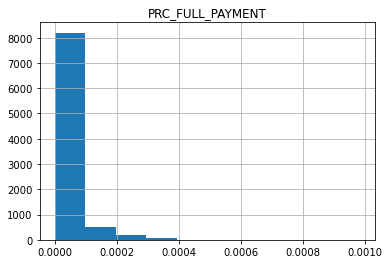

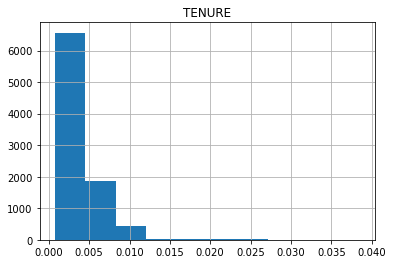

In [23]:
for col in normalized_df:
    normalized_df[[col]].hist()

### PRINCIPAL COMPONENT ANALYSIS

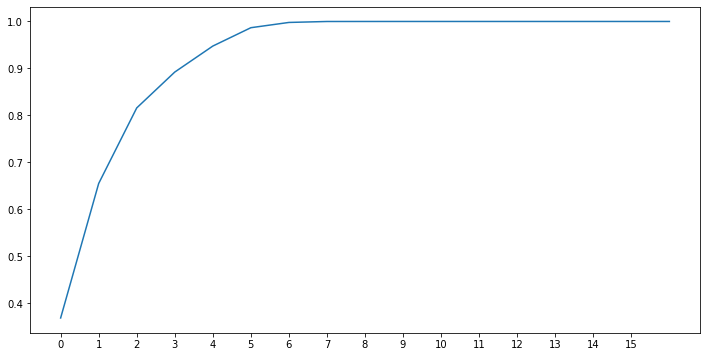

In [24]:
#appling PCA
pca = PCA() 
pcadf = pca.fit_transform(normalized_df) 
pcadf = pd.DataFrame(pcadf) 

plt.subplots(figsize=(12,6))
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.xticks(np.arange(0,16,1));

In [25]:
#Setting 2 as n_components
pca = PCA(n_components = 2) 
pcadf = pca.fit_transform(normalized_df) 
pcadf = pd.DataFrame(pcadf) 
pcadf.columns = ['PC1', 'PC2']   

pcadf.head()

,PC1,PC2
0,-0.296505,-0.030301
1,0.199265,-0.054623
2,-0.155933,-0.185948
3,-0.239007,-0.135427
4,0.195436,-0.059511


### <span style='background : yellow' > **TASK 3:**</span> EXPERIMENTS WITH DIFFERENT CLUSTER SETTINGS

### AGGLOMERATIVE CLUSTERING WITH DIFFERENT LIKAGES & DISTANCE MEASURES 

Number of Clusters : 2  linkage : complete
Number of Clusters : 2  linkage : single
Number of Clusters : 2  linkage : average
Number of Clusters : 3  linkage : complete
Number of Clusters : 3  linkage : single
Number of Clusters : 3  linkage : average
Number of Clusters : 4  linkage : complete
Number of Clusters : 4  linkage : single
Number of Clusters : 4  linkage : average
Number of Clusters : 5  linkage : complete
Number of Clusters : 5  linkage : single
Number of Clusters : 5  linkage : average
silhouette Scores  [0.3476420160433587, 0.3131865341705305, 0.44740231005179953, 0.45657382286761206, 0.25792256945124203, 0.4843146349789478, 0.42637073527887326, 0.2535248601020347, 0.4480417789914545, 0.36474898356259056, 0.2546906131973064, 0.4375187761086889]


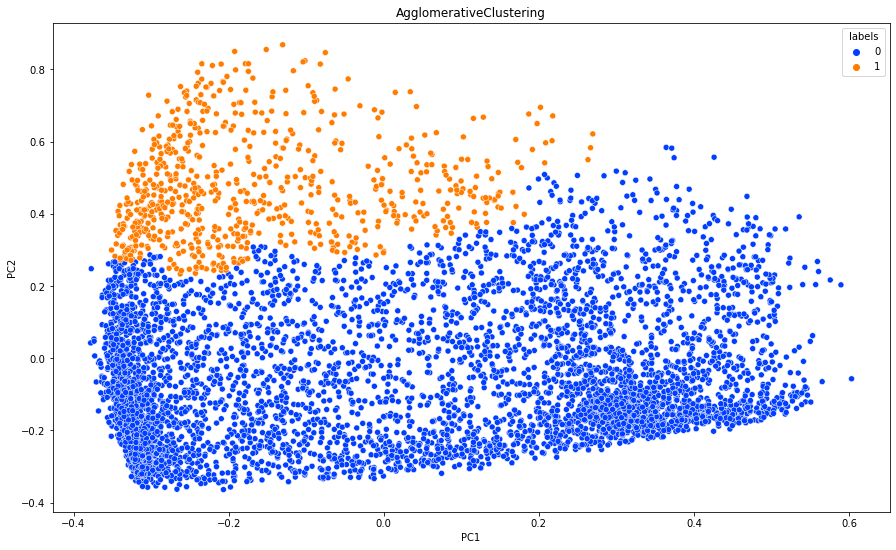

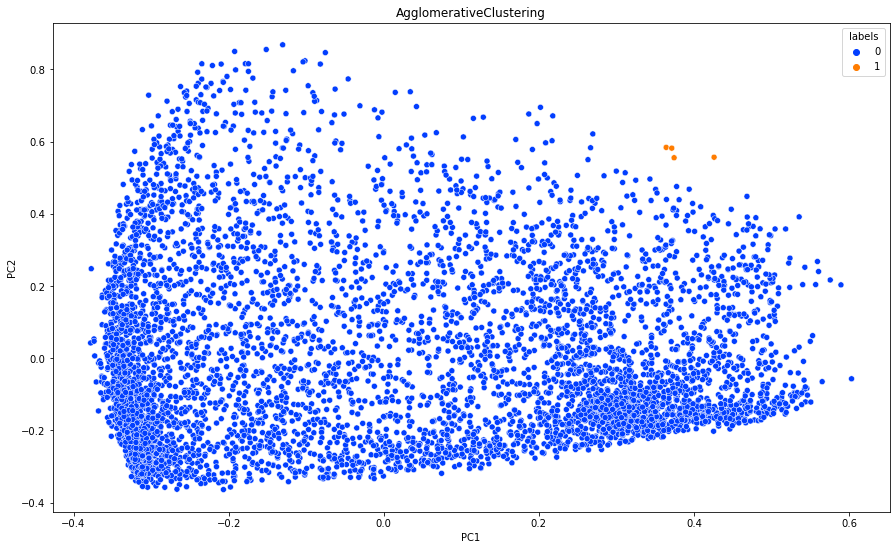

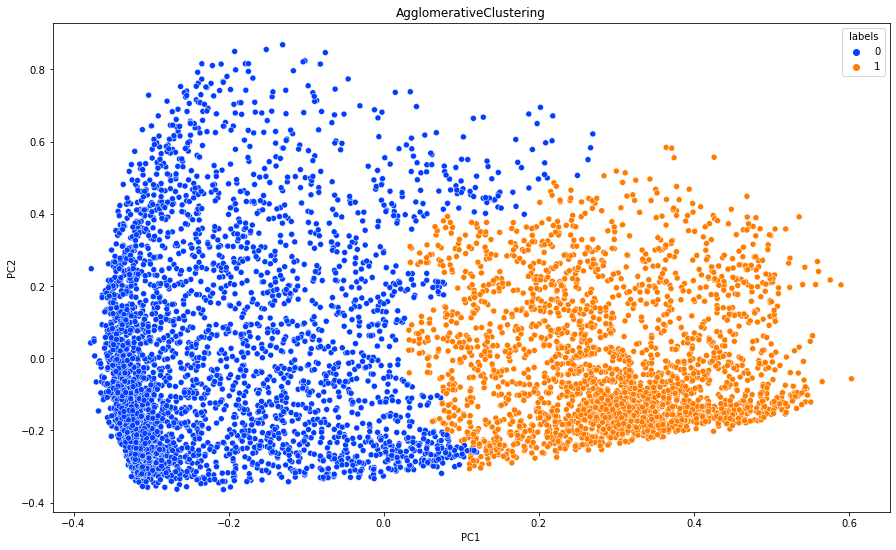

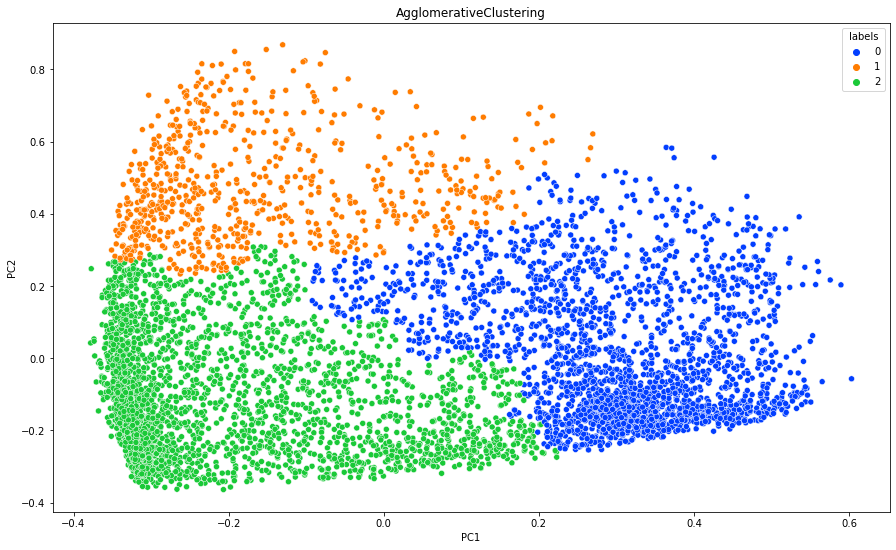

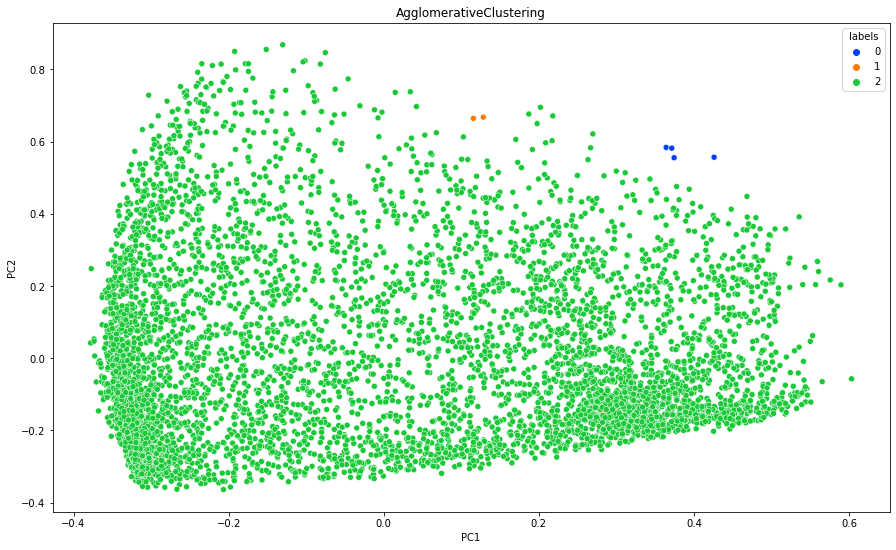

...

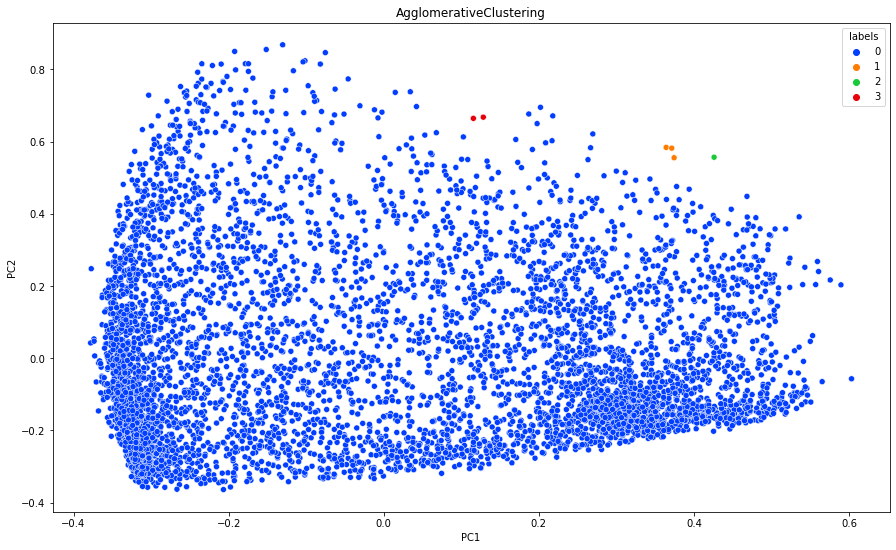

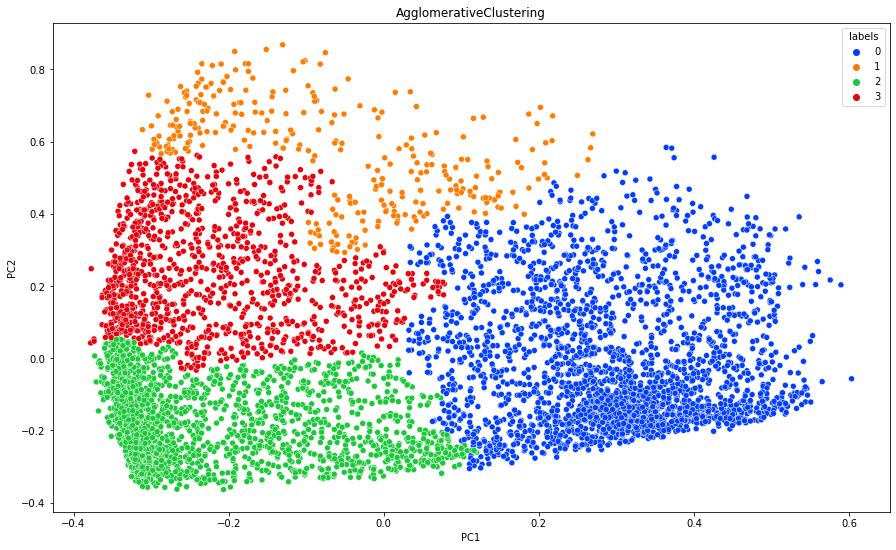

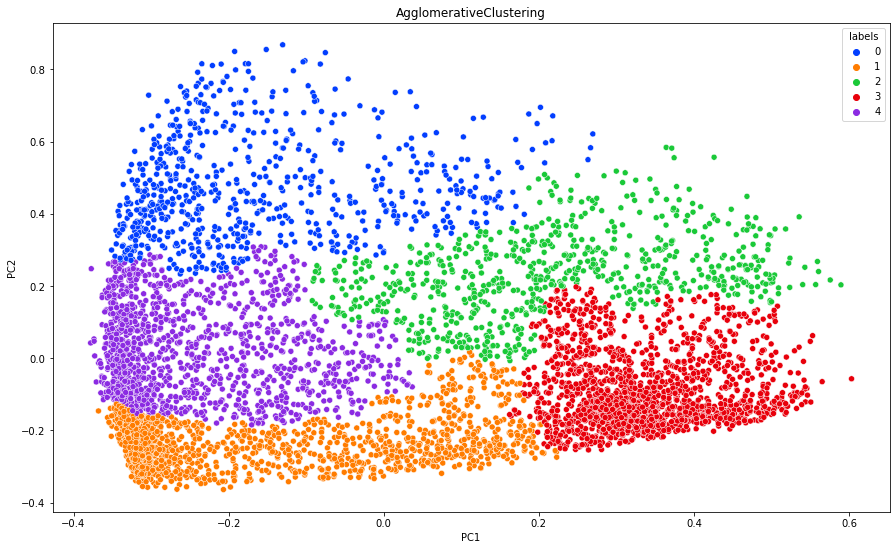

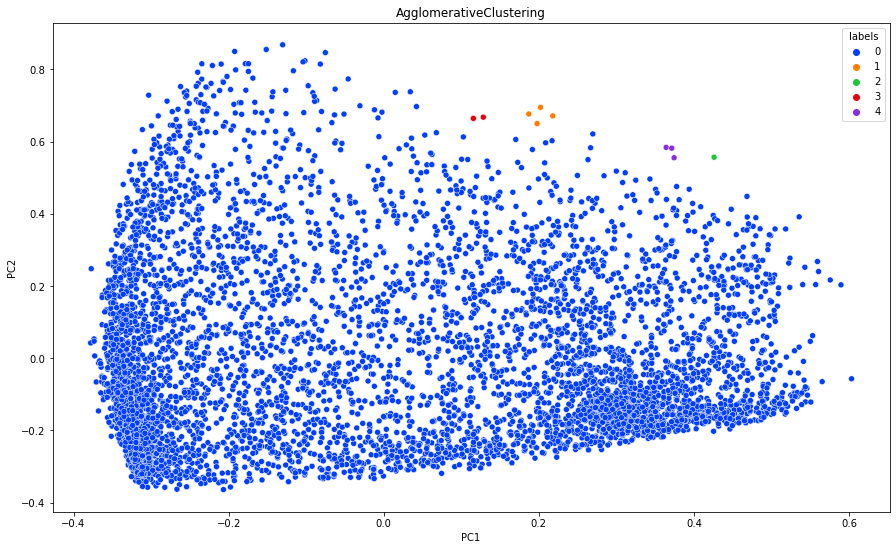

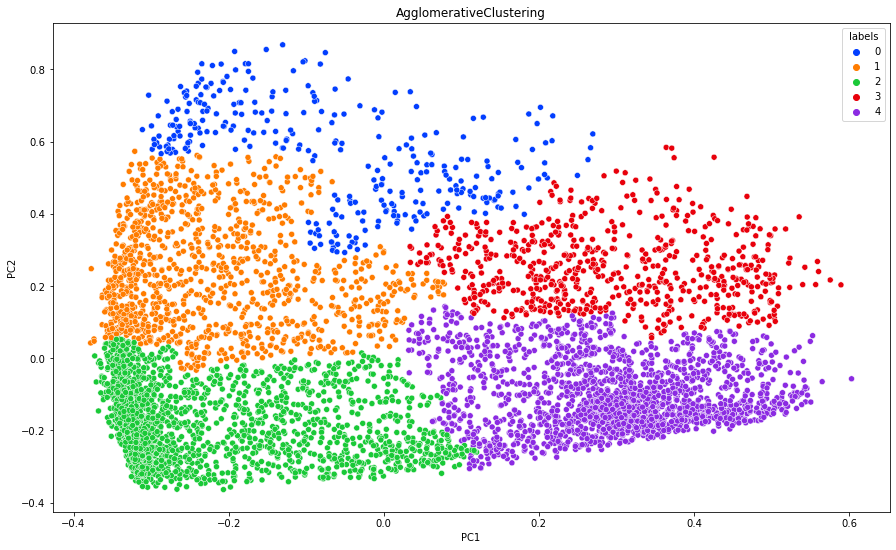

In [26]:
#train model and evaluate the performance
linkages = ["complete", "single", "average"]
silhouette_scores = []
hcluster = []

for i in range(2,6):
  for lk in linkages:
    hcluster = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage=lk)
    print("Number of Clusters : " + str(i) + "  linkage : "+lk)
    silhouette_scores.append(silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
    plot_model_clustering(hcluster, pcadf)
print("silhouette Scores ", silhouette_scores)                         

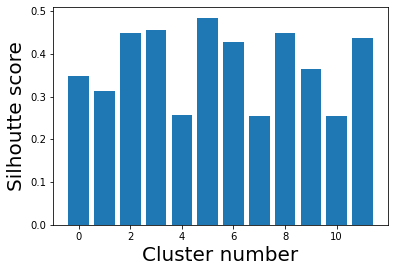

In [27]:
# Plotting a bar graph to compare the results
i = range(12)
plt.bar(i, silhouette_scores)
plt.xlabel('Cluster number', fontsize = 20)
plt.ylabel('Silhoutte score', fontsize = 20)
plt.show()

#### From the above plot, it appears that cluster with n_clusters=3, affinity='euclidean', linkage="average" seems to be having higher silhoutte score. Let's take a closer look at the same

Silhoutte Score 0.4480417789914545


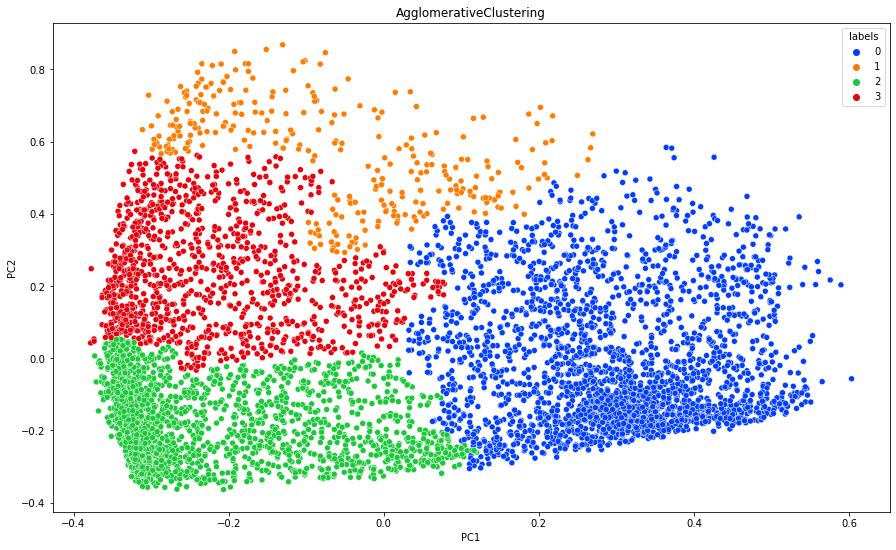

In [28]:
hcluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage="average")
print("Silhoutte Score", silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
plot_model_clustering(hcluster, pcadf)

Number of Clusters : 2  linkage : complete
Number of Clusters : 2  linkage : single
Number of Clusters : 2  linkage : average
Number of Clusters : 3  linkage : complete
Number of Clusters : 3  linkage : single
Number of Clusters : 3  linkage : average
Number of Clusters : 4  linkage : complete
Number of Clusters : 4  linkage : single
Number of Clusters : 4  linkage : average
Number of Clusters : 5  linkage : complete
Number of Clusters : 5  linkage : single
Number of Clusters : 5  linkage : average
[0.4134696438542733, 0.3131865341705305, 0.35005519950176966, 0.423066426619721, 0.2828505418935386, 0.4672838188614086, 0.4188477932250659, 0.25904723373779226, 0.4073149162556673, 0.39060510439183327, 0.25385576039739277, 0.3679704983837385]


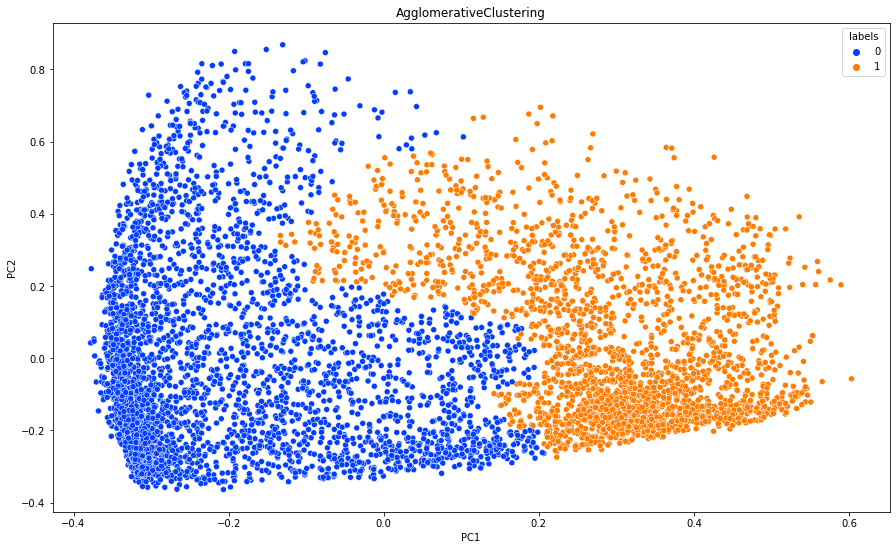

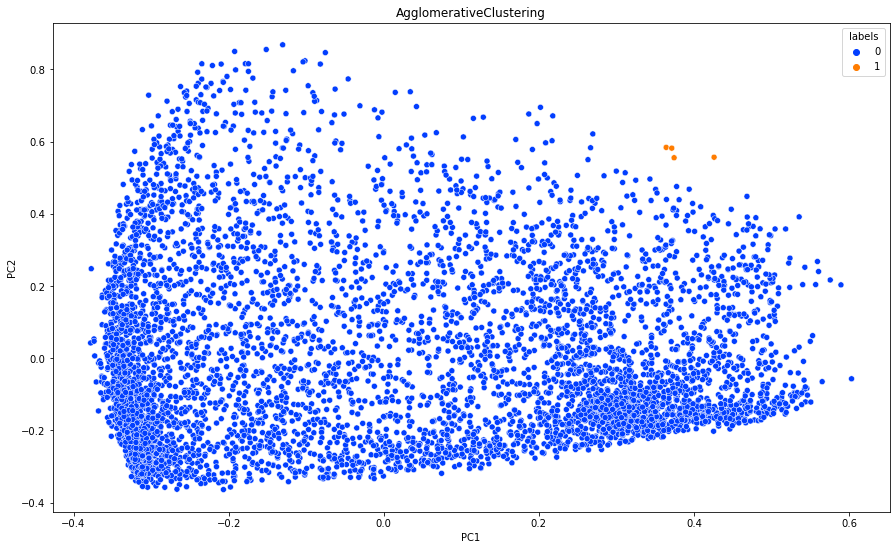

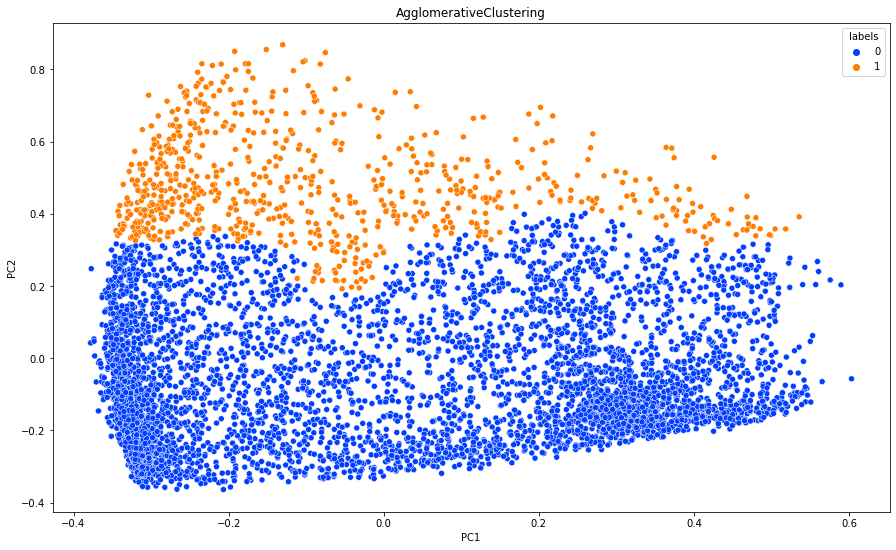

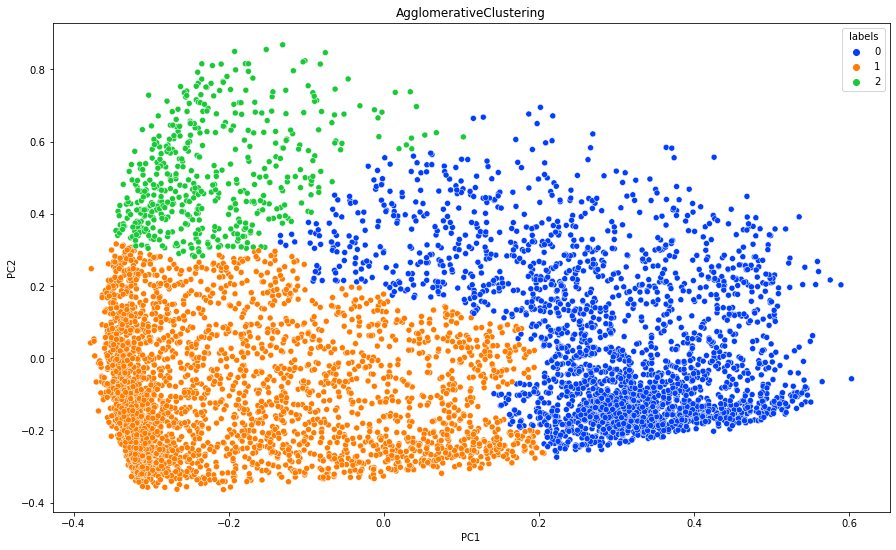

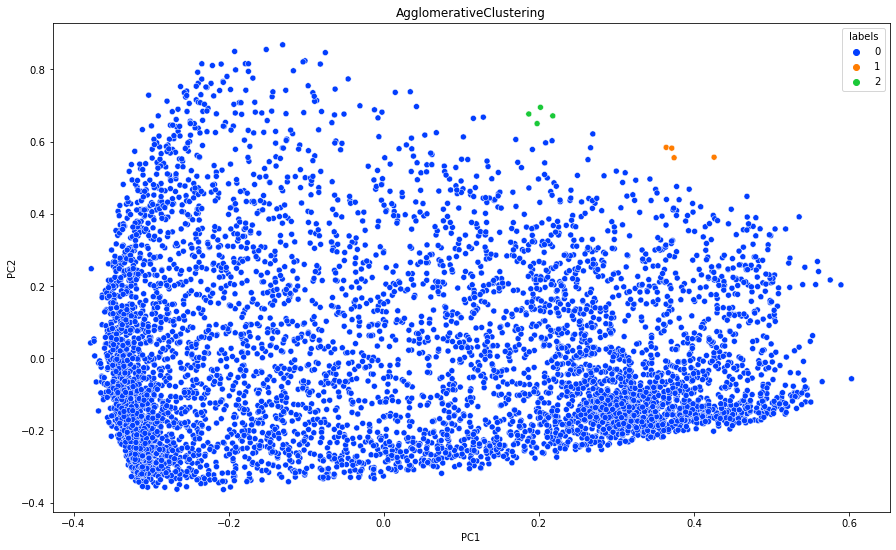

...

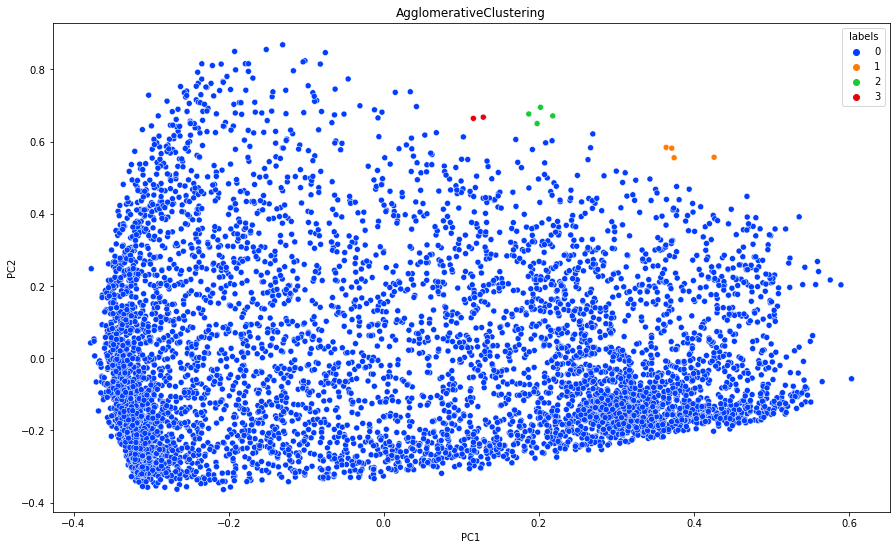

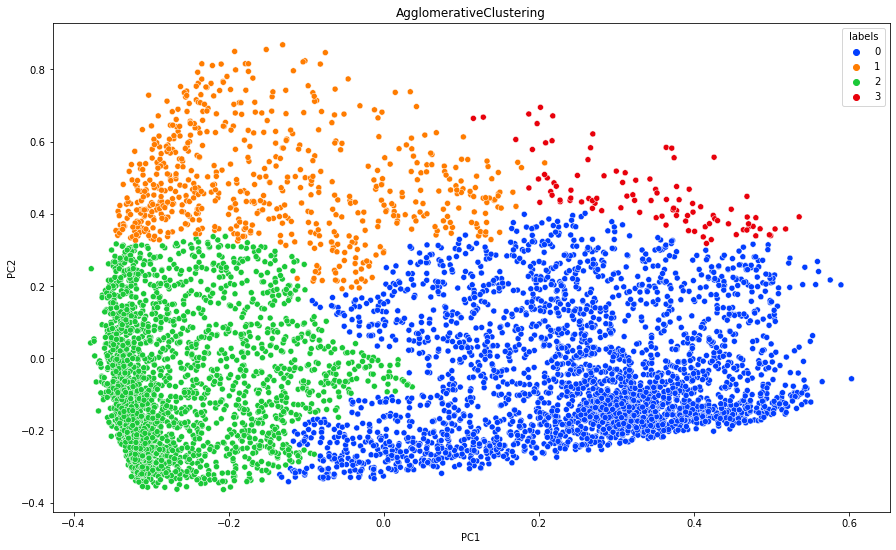

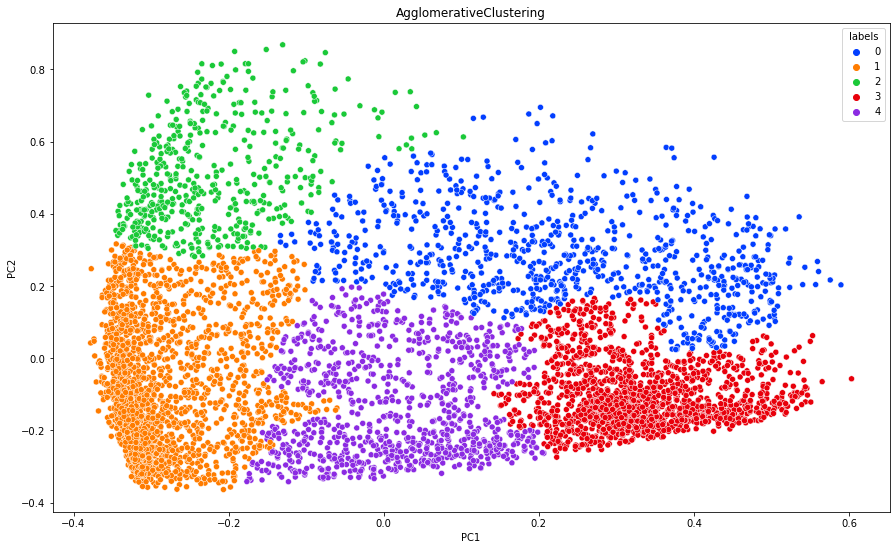

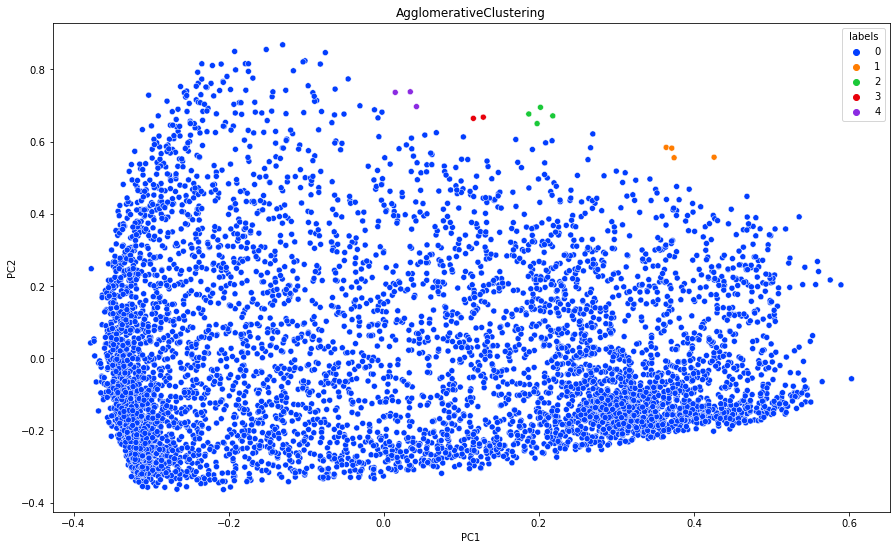

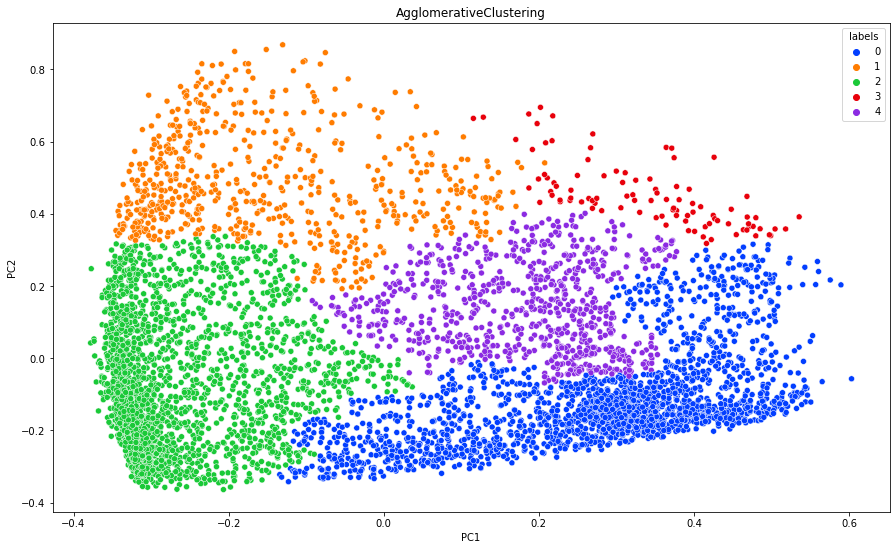

In [29]:
#train model and evaluate the performance
linkages = ["complete", "single", "average"]
silhouette_scores = []
hcluster = []

for i in range(2,6):
  for lk in linkages:
    hcluster = AgglomerativeClustering(n_clusters=i, affinity='manhattan', linkage=lk)
    print("Number of Clusters : " + str(i) + "  linkage : "+lk)
    silhouette_scores.append(silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
    plot_model_clustering(hcluster, pcadf)
print(silhouette_scores)     

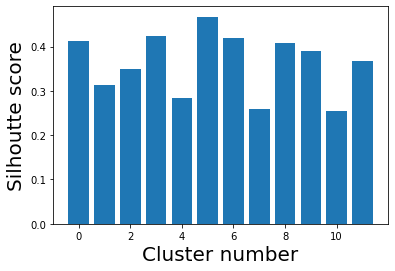

In [30]:
# Plotting a bar graph to compare the results
i = range(12)
plt.bar(i, silhouette_scores)
plt.xlabel('Cluster number', fontsize = 20)
plt.ylabel('Silhoutte score', fontsize = 20)
plt.show()

#### From the above plot, it appears that cluster with n_clusters=3, affinity='manhattan', linkage="average" seems to be having higher silhoutte score. Let's take a closer look at the same

Silhoutte Score 0.4672838188614086


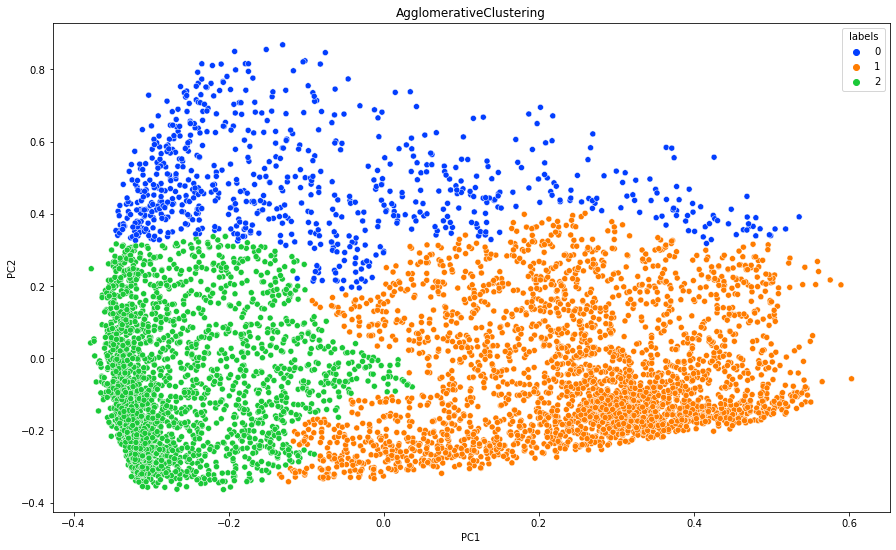

In [31]:
hcluster = AgglomerativeClustering(n_clusters=3, affinity='manhattan', linkage="average")
print("Silhoutte Score", silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
plot_model_clustering(hcluster, pcadf)

Number of Clusters : 2  linkage : complete
Number of Clusters : 2  linkage : single
Number of Clusters : 2  linkage : average
Number of Clusters : 3  linkage : complete
Number of Clusters : 3  linkage : single
Number of Clusters : 3  linkage : average
Number of Clusters : 4  linkage : complete
Number of Clusters : 4  linkage : single
Number of Clusters : 4  linkage : average
Number of Clusters : 5  linkage : complete
Number of Clusters : 5  linkage : single
Number of Clusters : 5  linkage : average
[0.4497062217752438, 0.4405749355621084, 0.39458512119808425, 0.31460693821563485, 0.2066937250395386, 0.4920209569551277, 0.3245334058734992, 0.12258356260117552, 0.46698524781097495, 0.38433406223102057, 0.0625367417429996, 0.3691064915887474]


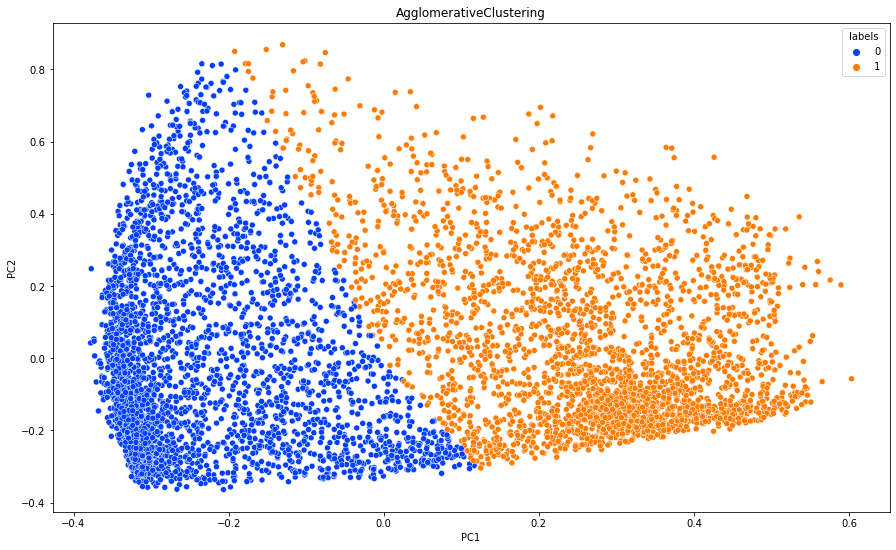

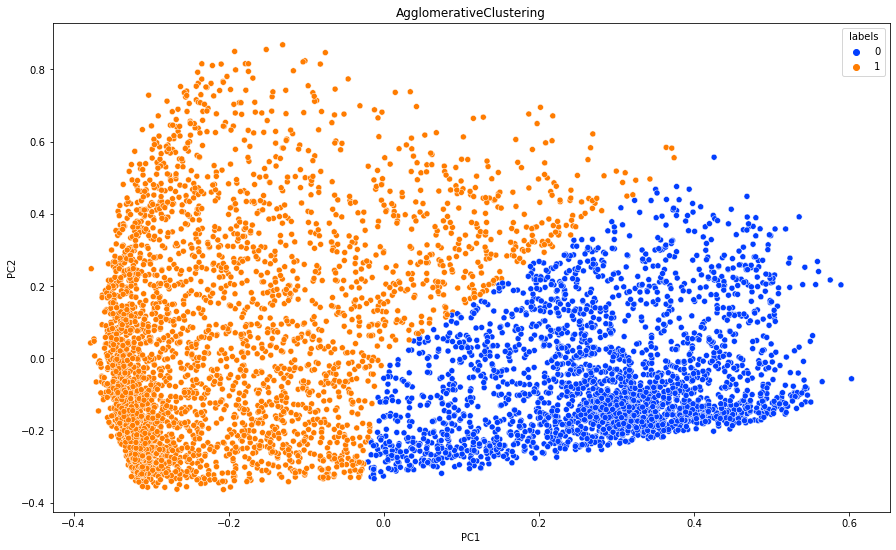

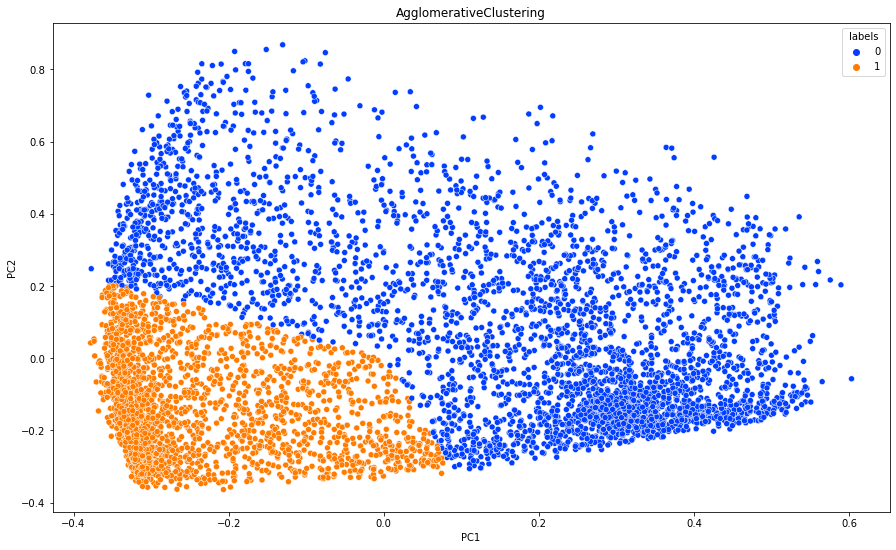

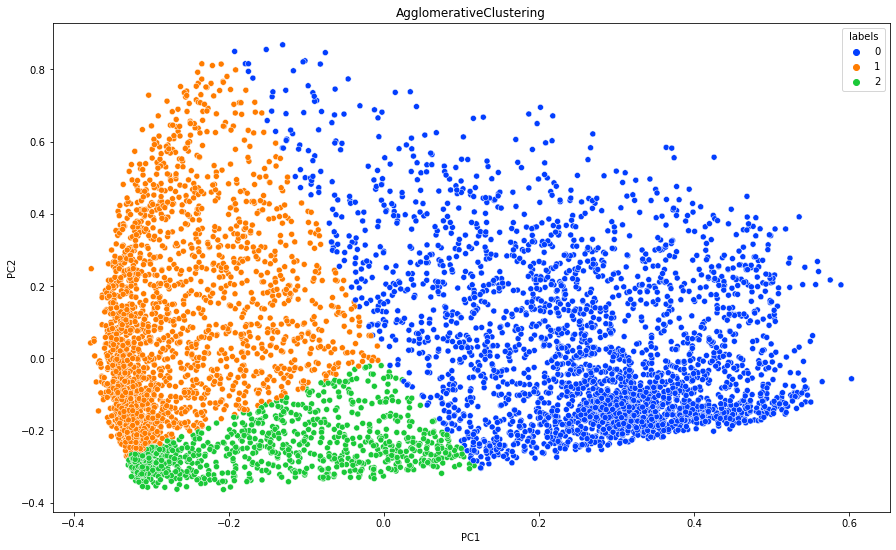

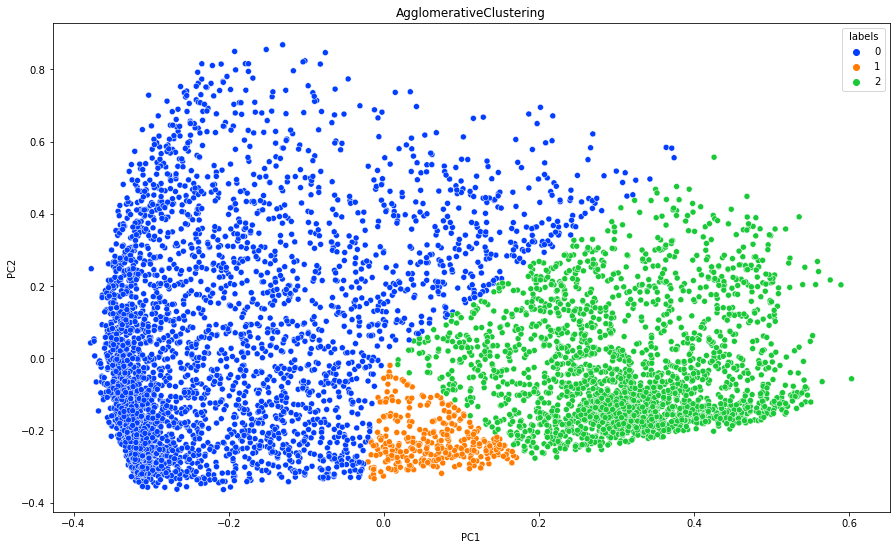

...

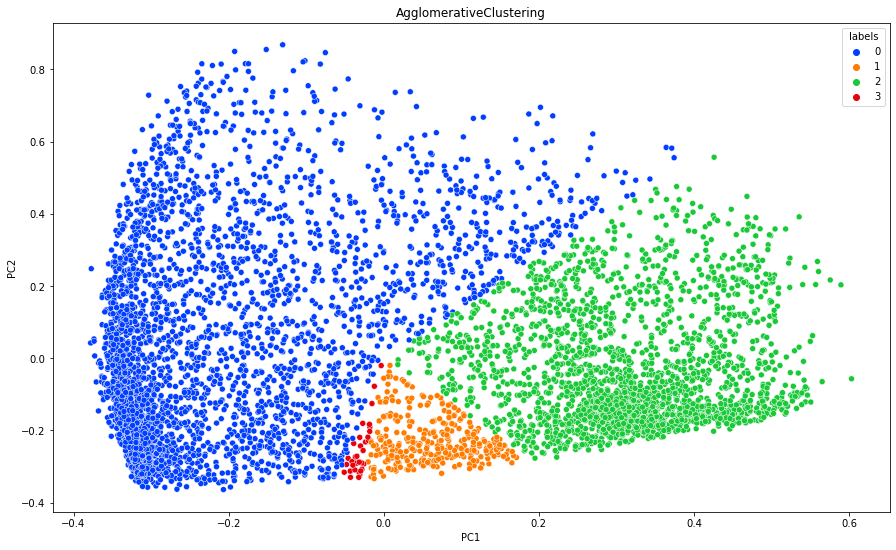

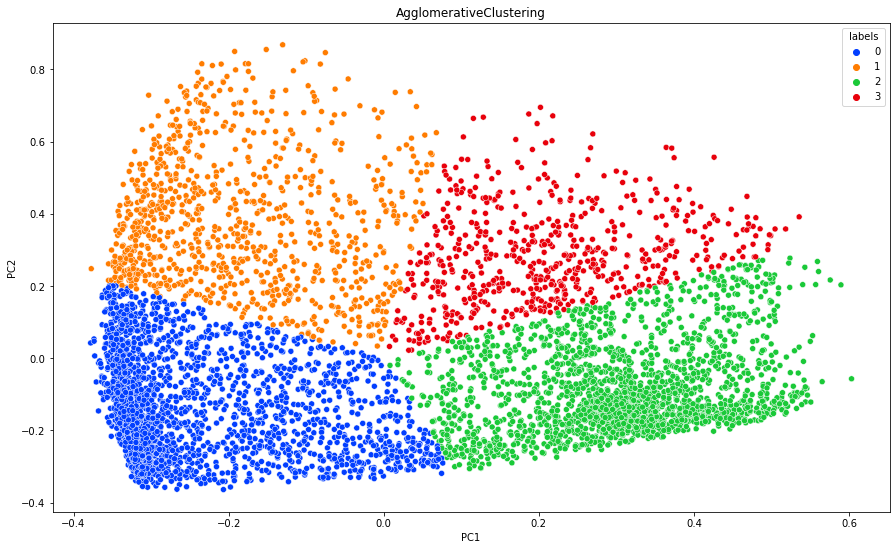

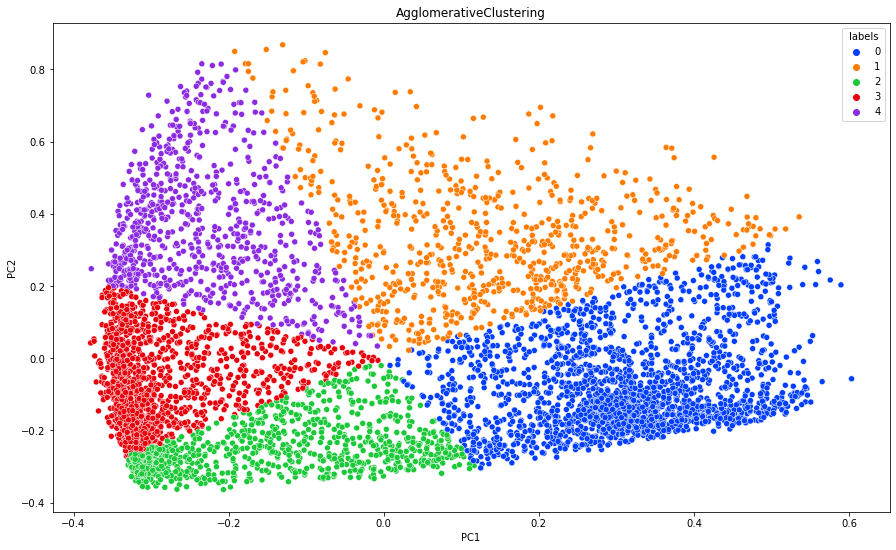

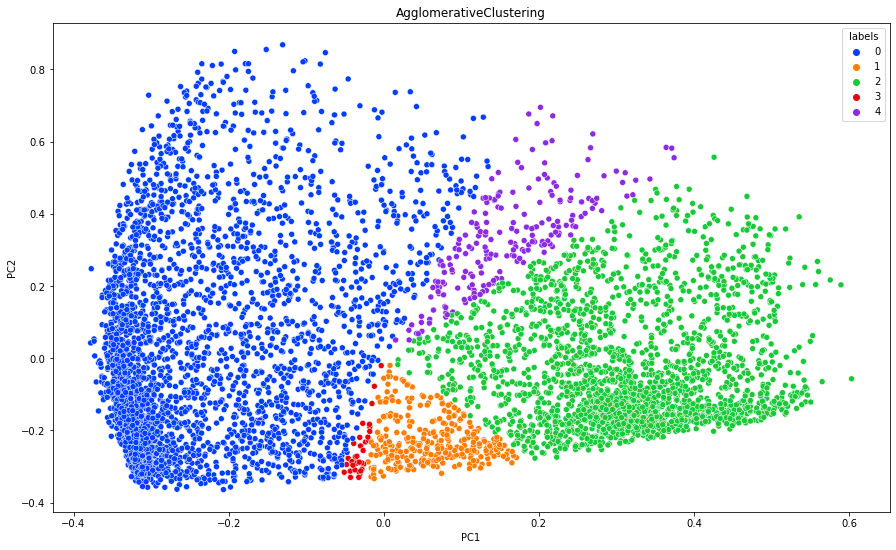

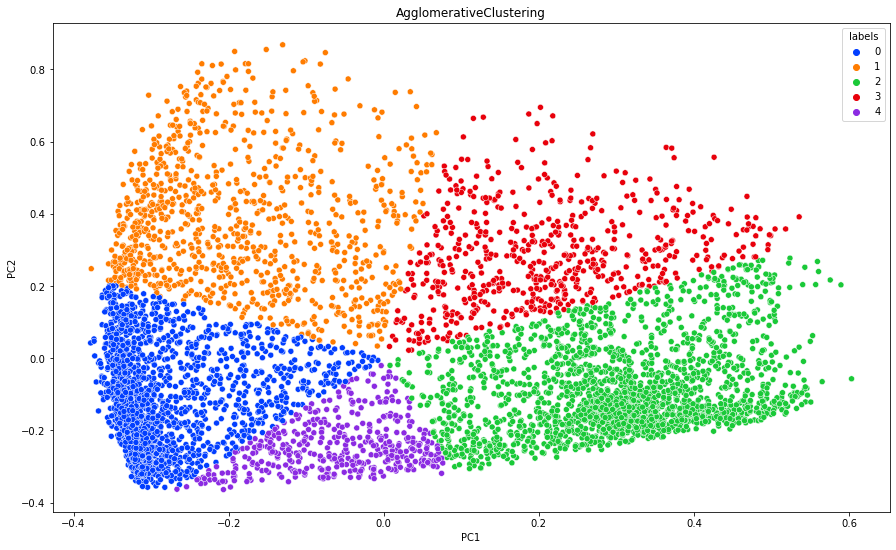

In [32]:
#train model and evaluate the performance
linkages = ["complete", "single", "average"]
silhouette_scores = []
hcluster = []

for i in range(2,6):
  for lk in linkages:
    hcluster = AgglomerativeClustering(n_clusters=i, affinity='cosine', linkage=lk)
    print("Number of Clusters : " + str(i) + "  linkage : "+lk)
    silhouette_scores.append(silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
    plot_model_clustering(hcluster, pcadf)
print(silhouette_scores)  

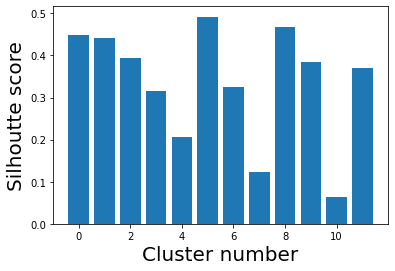

In [33]:
# Plotting a bar graph to compare the results
i = range(12)
plt.bar(i, silhouette_scores)
plt.xlabel('Cluster number', fontsize = 20)
plt.ylabel('Silhoutte score', fontsize = 20)
plt.show()

#### From the above plot, it appears that cluster with n_clusters=3, affinity='cosine', linkage="average" seems to be having higher silhoutte score. Let's take a closer look at the same

Silhoutte Score 0.4920209569551277


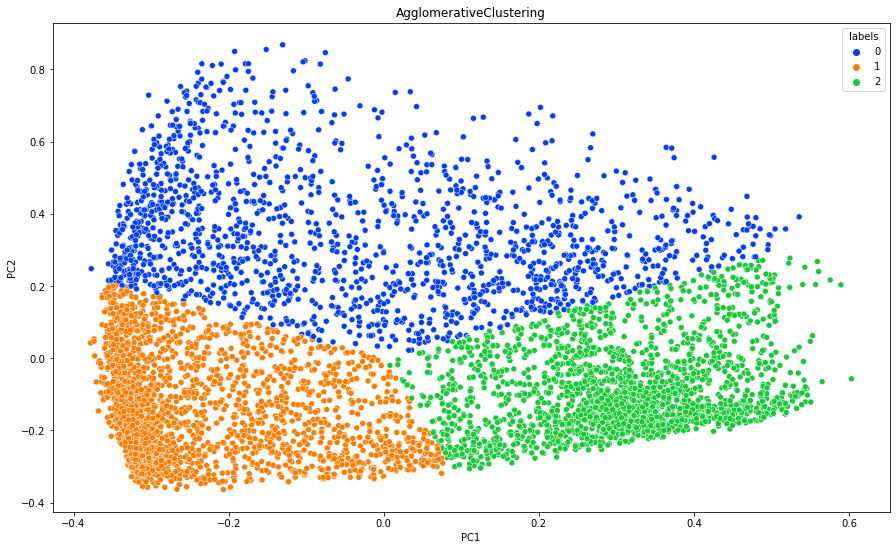

In [34]:
hcluster = AgglomerativeClustering(n_clusters=3, affinity='cosine', linkage="average")
print("Silhoutte Score", silhouette_score(pcadf, hcluster.fit_predict(pcadf)))
plot_model_clustering(hcluster, pcadf)

### DBSCAN CLUSTERING WITH DIFFERENT EPS VALUES & MIN POINTS 

Silhoutte Score -0.255005151559729


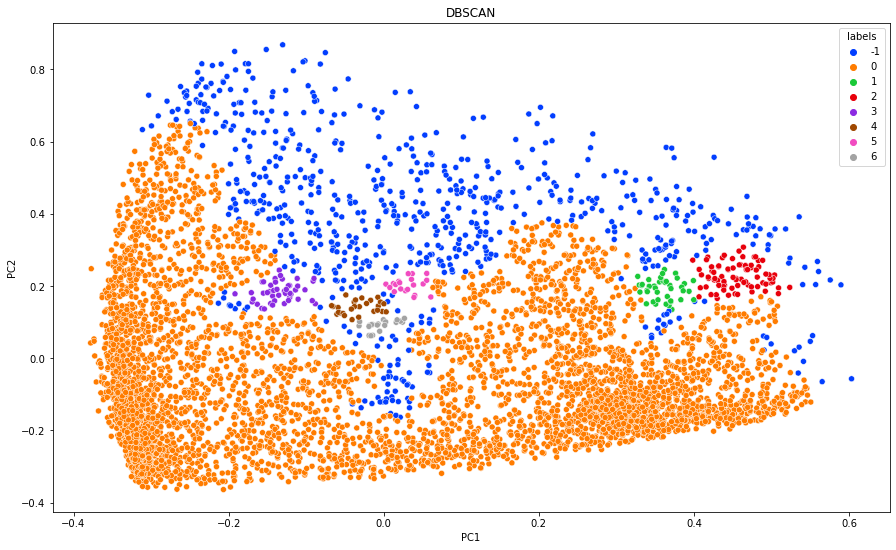

In [35]:
db = DBSCAN(eps = 0.0375, min_samples = 25).fit(pcadf)
plot_model_clustering(db, pcadf)
print("Silhoutte Score", silhouette_score(pcadf, db.fit_predict(pcadf)))

Silhoutte Score 0.10420469321650265


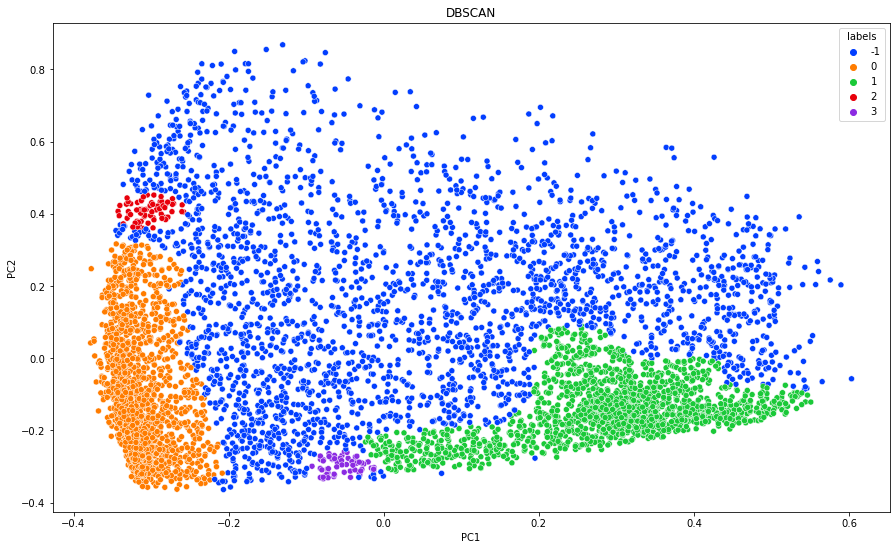

In [36]:
db = DBSCAN(eps = 0.0375, min_samples = 50).fit(pcadf)
plot_model_clustering(db, pcadf)
print("Silhoutte Score", silhouette_score(pcadf, db.fit_predict(pcadf)))

Silhoutte Score 0.171485137859366


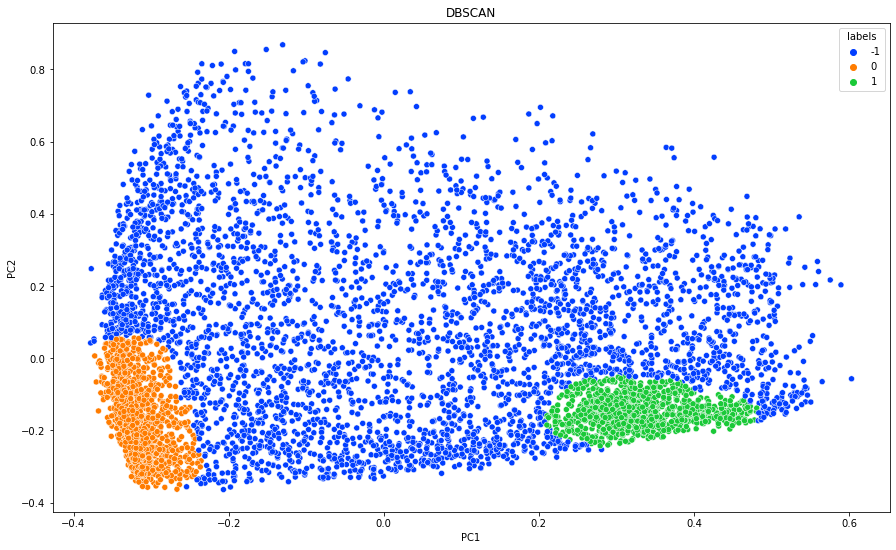

In [37]:
db = DBSCAN(eps = 0.0375, min_samples = 100).fit(pcadf)
plot_model_clustering(db, pcadf)
print("Silhoutte Score", silhouette_score(pcadf, db.fit_predict(pcadf)))

Silhoutte Score 0.21525492493726228


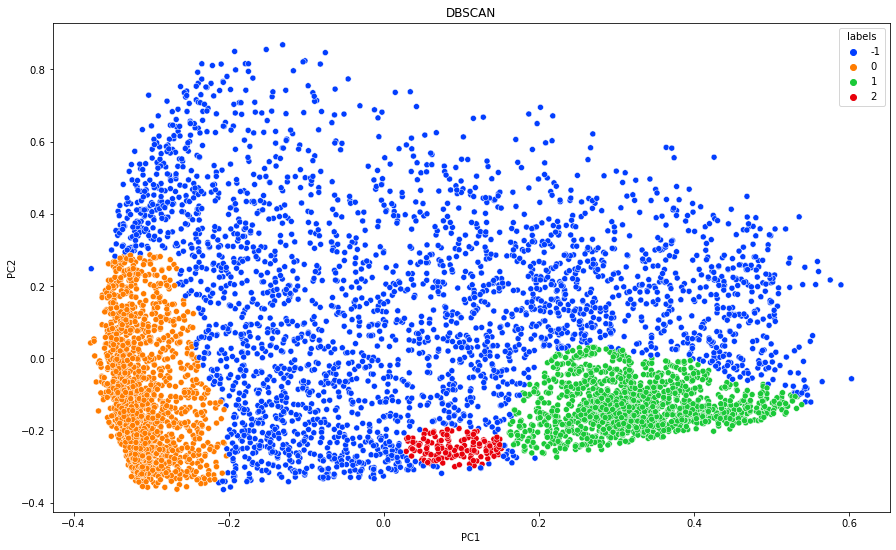

In [38]:
db = DBSCAN(eps = 0.05,  min_samples = 100).fit(pcadf)
print("Silhoutte Score", silhouette_score(pcadf, db.fit_predict(pcadf)))
plot_model_clustering(db, pcadf)

Silhoutte Score 0.27448895959436204


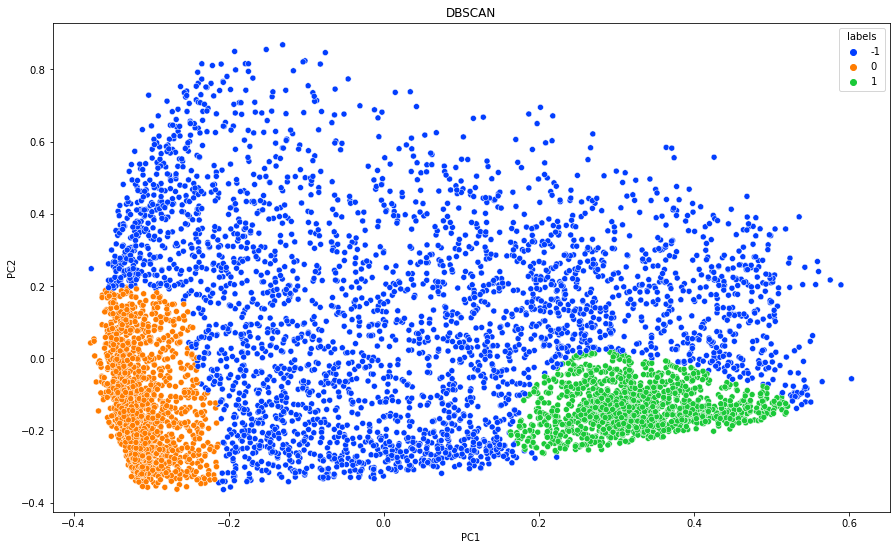

In [39]:
db = DBSCAN(eps = 0.048,  min_samples = 100).fit(pcadf)
print("Silhoutte Score", silhouette_score(pcadf, db.fit_predict(pcadf)))
plot_model_clustering(db, pcadf)

#### EXPERIMENTED WITH DIFFERENT VALUES OF CLUSTER SETTINGS:

##### FOR AGGLOMERTIVE CLUSTERING:
    n_clusters = 2, 3, 4, 5
    affinity='euclidean', 'manhattan', 'cosine'
    linkage="complete", "single", "average"

##### FOR DBSCAN CLUSTERING:
    eps values= 0.0375, 0.1, 0.05, 0.048
    min_sample values= 25, 50,100


### <span style='background : yellow' > **CONCLUSION: DETERMINE THE BEST CLUSTER**   </span>

#### The highest Silhoutte score achieved for DBSCAN algorithm is 0.27448895959436204 for eps = 0.048,  min_samples = 100 with 3 clusters
#### The highest Silhoutte score achieved for Agglomerative algorithm is 0.4920209569551277 for n_clusters = 3, distance measure cosine and linkage 'average' 

#### Hence, both DBSCAN & Agglomerative with <span style='background : yellow' > **3** </span> number of clusters are good to use however based on the Silhoutte score,  <span style='background : yellow' >  Agglomerative is the best  </span>

### <span style='background : yellow' > **We can also confirm the optimal number of clusters with a Dendrogram below**</span>

### PLOT DENDROGRAM 
### (Practical Visualization)

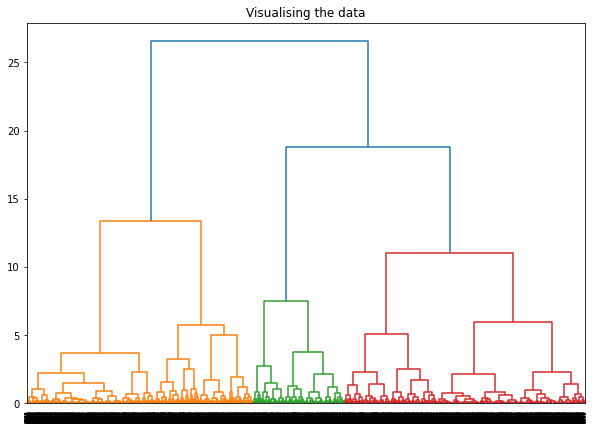

In [40]:
plt.figure(figsize =(10, 7))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(pcadf, method ='ward')))

#### The x-axis contains the samples and y-axis represents the distance between these samples.
#### The vertical line with maximum distance is the blue line and hence we can decide a threshold of 15 and cut the dendrogram

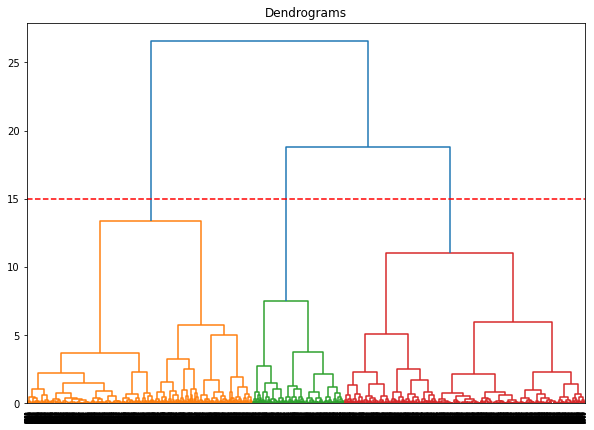

In [41]:
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(pcadf, method='ward'))
plt.axhline(y=15, color='r', linestyle='--')

#### We have <span style='background : yellow' > *three* </span> clusters as this line cuts the dendrogram at  <span style='background : yellow' > *three* </span>  points. 3 is the best number of clusters we had obtained with Agglomerative algorithm as well 

### <span style='background : yellow' > **TASK 4:**</span> BUSINESS INSIGHTS / CLUSTER INTERPRETATION

### PLOT PARALLEL COORDINATES

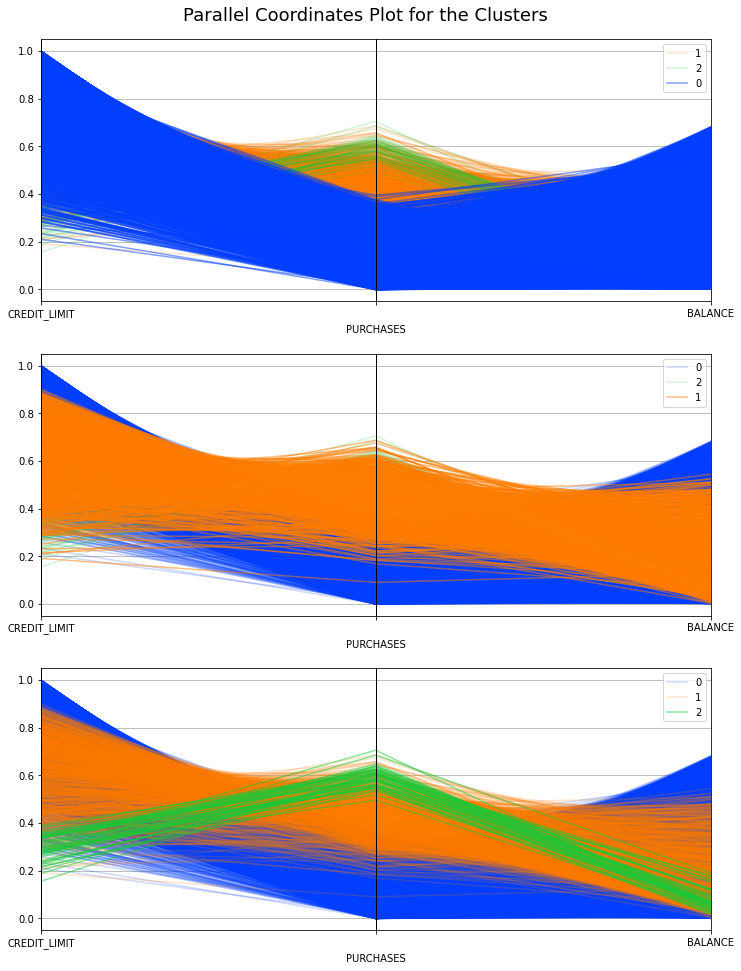

In [42]:
normalized_df1 = normalized_df[['CREDIT_LIMIT','PURCHASES','BALANCE']]
palette = sns.color_palette("bright", 10)
cluster = []

hcluster = AgglomerativeClustering(n_clusters=3, affinity='cosine', linkage="average")
cluster = hcluster.fit_predict(normalized_df1)
normalized_df1["cluster"] = cluster

display_parallel_coordinates(normalized_df1, 3)

#### Since we have determined 3 as the optimal number of clusters, we could interpret the data from the parallel coordinates plot as follows:
    
    Cluster 0. High Credit Limit, Medium Purchase - The credit card users with High Credit Limit and made medium purchases have formed second cluster. Bank should offer these customers with credit card upgradation and credit limit enhancements. They can also be targeted for pension plans.
        
    Cluster 1. High Credit Limit, High Purchase - The credit card users with High Credit Limit and High Purchase have formed one cluster and can be potential customers since they made high purchases and at the same time had high balance amounts too. The bank has an opportunity to propose investment plans to these customers.
       
    Cluster 2. Low Credit Limit, High Purchase - The credit card users with Low Credit Limit but made high purchases have formed the third cluster. Business can look at offering better services to these customers like providing insurance plans and loan offerings.
    
    This will enable the bank to target and sell to those customers competitively and economically that are most likely to buy their products or services as the bank now understands its customer’s requirements very well. So a marketing strategy that looked at the above three groups can be highly effective for the bank to come up with strategy to improve its profitability by targeting potential customers from its existing customer database in turn providing better customer service too. 